https://arxiv.org/abs/1511.05644

In [2]:

import os
import numpy as np
import math
import itertools

import torchvision.transforms as transforms
from torchvision.utils import save_image

from torch.utils.data import DataLoader
from torchvision import datasets
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
import torch

os.makedirs("images", exist_ok=True)

class Args:
    n_epochs = 200
    batch_size = 64
    lr = 0.0002
    b1 = 0.5
    b2 = 0.999
    n_cpu = 8
    latent_dim = 10
    img_size = 96
    channels = 3
    sample_interval = 400
opt = Args()

print(opt)

img_shape = (opt.channels, opt.img_size, opt.img_size)

cuda = True if torch.cuda.is_available() else False


def reparameterization(mu, logvar):
    std = torch.exp(logvar / 2)
    sampled_z = Variable(Tensor(np.random.normal(0, 1, (mu.size(0), opt.latent_dim))))
    z = sampled_z * std + mu
    return z


class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(int(np.prod(img_shape)), 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 512),
            nn.BatchNorm1d(512),
            nn.LeakyReLU(0.2, inplace=True),
        )

        self.mu = nn.Linear(512, opt.latent_dim)
        self.logvar = nn.Linear(512, opt.latent_dim)

    def forward(self, img):
        img_flat = img.view(img.shape[0], -1)
        x = self.model(img_flat)
        mu = self.mu(x)
        logvar = self.logvar(x)
        z = reparameterization(mu, logvar)
        return z


class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(opt.latent_dim, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 512),
            nn.BatchNorm1d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, int(np.prod(img_shape))),
            nn.Tanh(),
        )

    def forward(self, z):
        img_flat = self.model(z)
        img = img_flat.view(img_flat.shape[0], *img_shape)
        return img


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(opt.latent_dim, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )

    def forward(self, z):
        validity = self.model(z)
        return validity


# Use binary cross-entropy loss
adversarial_loss = torch.nn.BCELoss()
pixelwise_loss = torch.nn.L1Loss()

# Initialize generator and discriminator
encoder = Encoder()
decoder = Decoder()
discriminator = Discriminator()

if cuda:
    encoder.cuda()
    decoder.cuda()
    discriminator.cuda()
    adversarial_loss.cuda()
    pixelwise_loss.cuda()

# Configure data loader
# Turn images to grayscale and reduce number of dimensions to 1

os.makedirs("../../data/stl10", exist_ok=True)
dataloader = torch.utils.data.DataLoader(
    datasets.STL10(
        "../../data/stl10",
        split="train",
        download=True,

        transform=transforms.Compose(
            [transforms.Resize(opt.img_size), transforms.ToTensor(), transforms.Normalize([0.5], [0.5])]
        ),
    ),
    batch_size=opt.batch_size,
    shuffle=True,
)

# Optimizers
optimizer_G = torch.optim.Adam(
    itertools.chain(encoder.parameters(), decoder.parameters()), lr=opt.lr, betas=(opt.b1, opt.b2)
)
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))

Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor


def sample_image(n_row, batches_done):
    """Saves a grid of generated digits"""
    # Sample noise
    z = Variable(Tensor(np.random.normal(0, 1, (n_row ** 2, opt.latent_dim))))
    gen_imgs = decoder(z)
    save_image(gen_imgs.data, "images/%d.png" % batches_done, nrow=n_row, normalize=True)


# ----------
#  Training
# ----------

for epoch in range(opt.n_epochs):
    for i, (imgs, _) in enumerate(dataloader):

        # Adversarial ground truths
        valid = Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False)
        fake = Variable(Tensor(imgs.shape[0], 1).fill_(0.0), requires_grad=False)

        # Configure input
        real_imgs = Variable(imgs.type(Tensor))

        # -----------------
        #  Train Generator
        # -----------------

        optimizer_G.zero_grad()

        encoded_imgs = encoder(real_imgs)
        decoded_imgs = decoder(encoded_imgs)

        # Loss measures generator's ability to fool the discriminator
        g_loss = 0.001 * adversarial_loss(discriminator(encoded_imgs), valid) + 0.999 * pixelwise_loss(
            decoded_imgs, real_imgs
        )

        g_loss.backward()
        optimizer_G.step()

        # ---------------------
        #  Train Discriminator
        # ---------------------

        optimizer_D.zero_grad()

        # Sample noise as discriminator ground truth
        z = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], opt.latent_dim))))

        # Measure discriminator's ability to classify real from generated samples
        real_loss = adversarial_loss(discriminator(z), valid)
        fake_loss = adversarial_loss(discriminator(encoded_imgs.detach()), fake)
        d_loss = 0.5 * (real_loss + fake_loss)

        d_loss.backward()
        optimizer_D.step()

        print(
            "[Epoch %d/%d] [Batch %d/%d] [D loss: %f] [G loss: %f]"
            % (epoch, opt.n_epochs, i, len(dataloader), d_loss.item(), g_loss.item())
        )

        batches_done = epoch * len(dataloader) + i
        if batches_done % opt.sample_interval == 0:
            sample_image(n_row=10, batches_done=batches_done)

Files already downloaded and verified


C:\Users\ZULUL\AppData\Local\Temp\ipykernel_21908\468477219.py:167: UserWarning: The torch.cuda.*DtypeTensor constructors are no longer recommended. It's best to use methods such as torch.tensor(data, dtype=*, device='cuda') to create tensors. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\tensor\python_tensor.cpp:85.)
  valid = Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False)


[Epoch 0/200] [Batch 0/782] [D loss: 0.692454] [G loss: 0.499615]
[Epoch 0/200] [Batch 1/782] [D loss: 0.685782] [G loss: 0.477158]
[Epoch 0/200] [Batch 2/782] [D loss: 0.678797] [G loss: 0.456224]
[Epoch 0/200] [Batch 3/782] [D loss: 0.669893] [G loss: 0.438355]
[Epoch 0/200] [Batch 4/782] [D loss: 0.678780] [G loss: 0.413077]
[Epoch 0/200] [Batch 5/782] [D loss: 0.665939] [G loss: 0.419062]
[Epoch 0/200] [Batch 6/782] [D loss: 0.652879] [G loss: 0.424722]
[Epoch 0/200] [Batch 7/782] [D loss: 0.651854] [G loss: 0.412133]
[Epoch 0/200] [Batch 8/782] [D loss: 0.637086] [G loss: 0.352398]
[Epoch 0/200] [Batch 9/782] [D loss: 0.615806] [G loss: 0.373962]
[Epoch 0/200] [Batch 10/782] [D loss: 0.612518] [G loss: 0.350116]
[Epoch 0/200] [Batch 11/782] [D loss: 0.612592] [G loss: 0.382920]
[Epoch 0/200] [Batch 12/782] [D loss: 0.578229] [G loss: 0.338536]
[Epoch 0/200] [Batch 13/782] [D loss: 0.569996] [G loss: 0.352510]
[Epoch 0/200] [Batch 14/782] [D loss: 0.580048] [G loss: 0.337363]
[Epoc

C:\Users\ZULUL\AppData\Local\Temp\ipykernel_24360\3468326261.py:17: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
C:\Users\ZULUL\AppData\Local\Temp\ipykernel_24360\3468326261.py:19: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


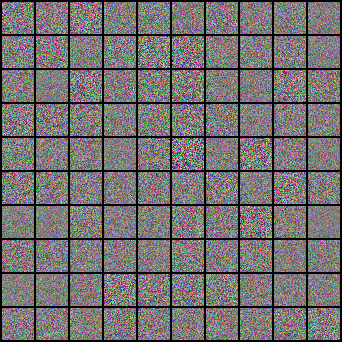

In [2]:
# Create a gif from the images saved during training
import imageio
import glob

anim_file = 'adversarial_autoencoder.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('images/*.png')
    filenames = sorted(filenames)
    last = -1
    for i,filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

import IPython.display as display
display.Image(anim_file)
